In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib 
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import squidpy as sq
from scipy.spatial.distance import pdist, squareform
import scipy
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from sklearn import metrics
import tabulate
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
import itertools
import umap
from importlib import reload
from scipy import stats
import matplotlib.image as mpimg
import goatools
from goatools.anno.gaf_reader import GafReader
import Bio.UniProt.GOA as GOA
import gget

# locals
import utils as ut
reload(ut)

2022-11-21 10:24:07.934747: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-21 10:24:08.065436: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/slurm/lib64:
2022-11-21 10:24:08.065460: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-11-21 10:24:08.091081: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-21 10:24:09.4628

<module 'utils' from '/home/cstansbu/git_repositories/spatial_transcriptomics/clustering/utils.py'>

In [2]:
dirPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/"

adata = {}

for f in os.listdir(dirPath):
    
    if f.endswith('.h5ad'):
        key = f.split(".")[0]
        fullPath = f"{dirPath}{f}"
        data = sc.read(fullPath)
        adata[key] = data
    
print("done")

done


In [3]:
# load cluster assignments
cdf = pd.read_csv("clusterAssignments.csv")
cid = {}

for key in cdf['key'].unique():
    t = cdf[cdf['key'] == key]
    cid[key] = t
    
print('done')

done


In [4]:
cdf['cellType'].unique()

array(['NK cells', 'B cells', 'T cells', 'Dendritic cells', 'Monocytes',
       'Stromal cells', 'Macrophages'], dtype=object)

ND Macrophages (1261,) 4
9.811174095375463e-11
HFD8 Macrophages (6123,) 8
1.134594640461728e-10
HFD14 Macrophages (6436,) 8
9.7855945568881e-11


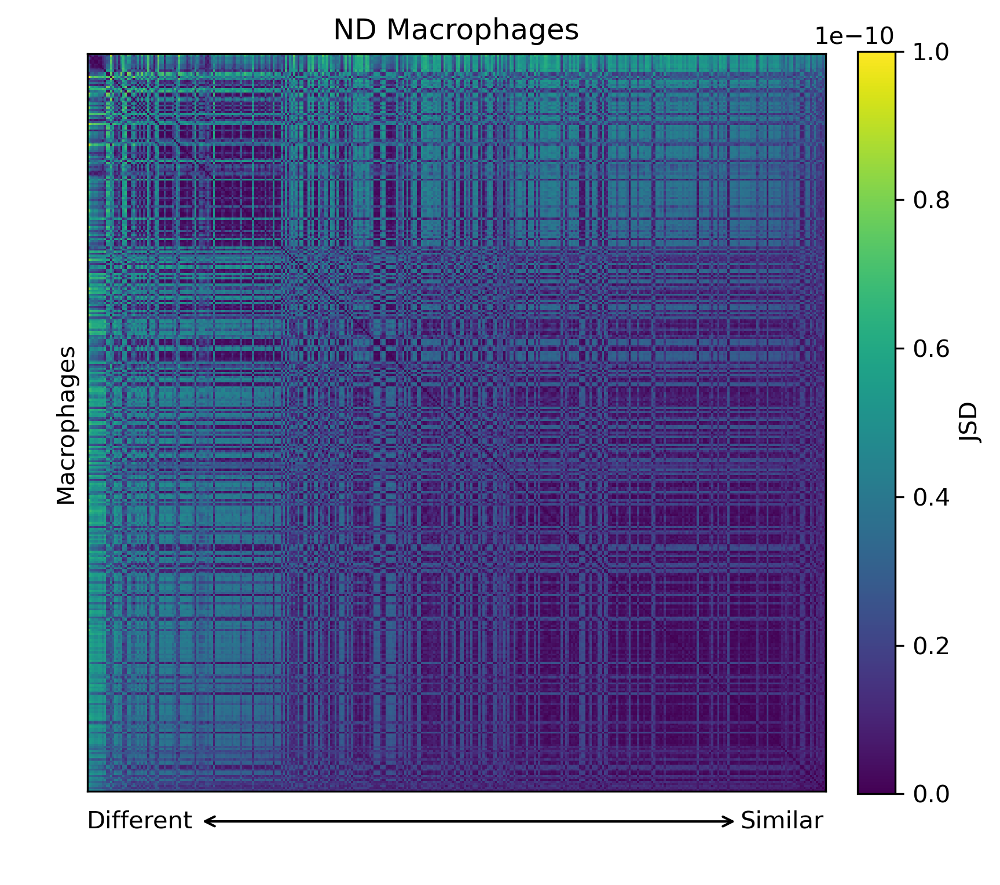

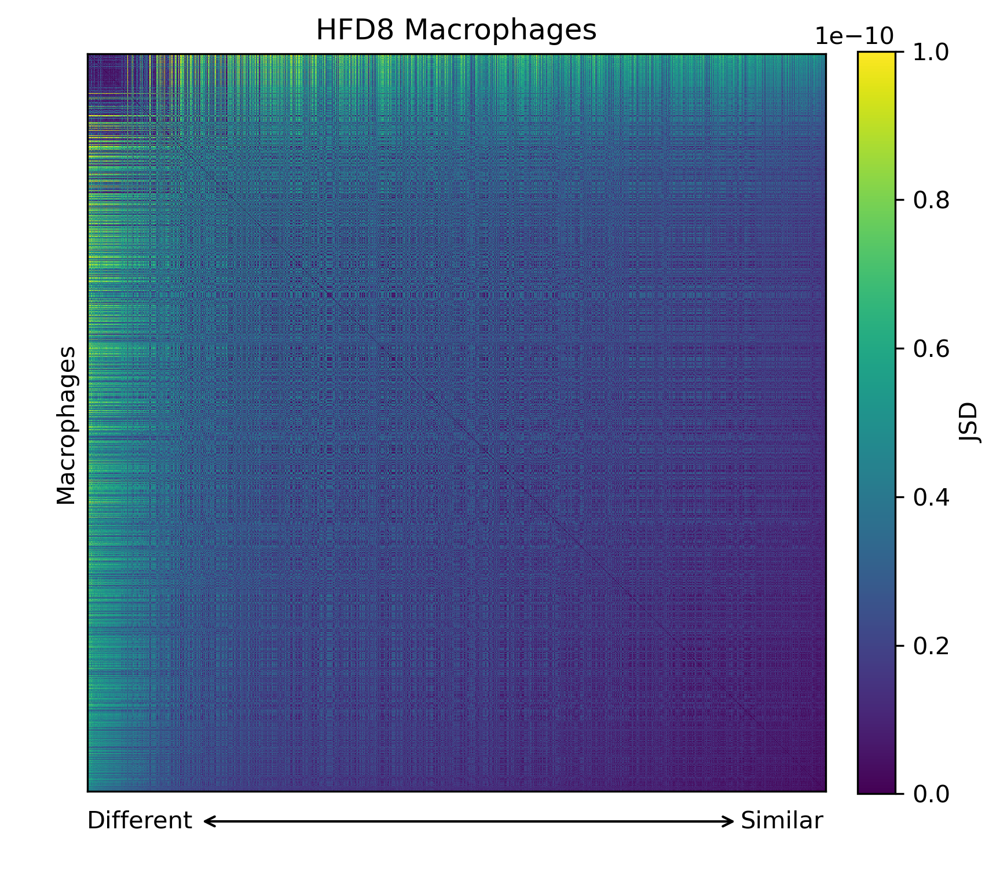

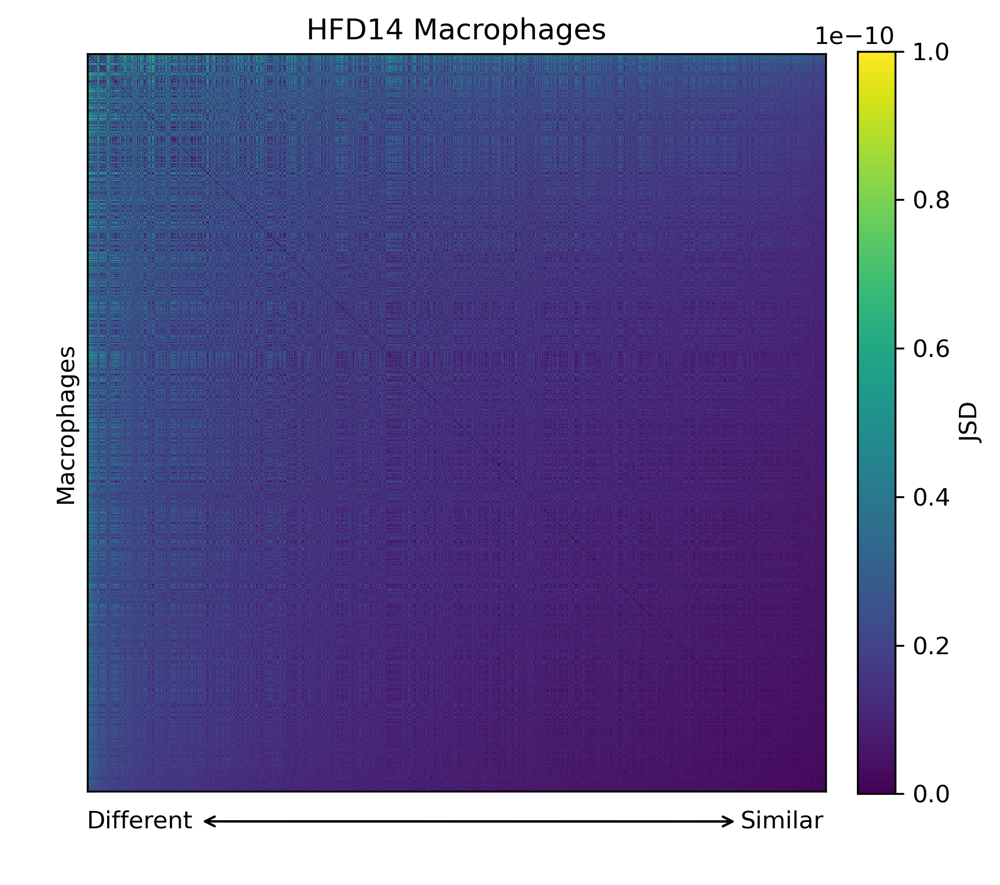

In [5]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 6, 6
keys = ['ND', 'HFD8', 'HFD14']
nPCA = 10
vmax = 10e-11

ctypes = ['Macrophages']

res = []


def jsd(x1, x2, nudge=1e6):
    """symmetric KL divergence """
    x1 = x1 + nudge
    x2 = x2 + nudge
    kl1 = scipy.stats.entropy(x1, x2)
    kl2 = scipy.stats.entropy(x2, x1)
    return (kl1 + kl2) / 2

for key in keys:
    data = adata[key]
    
    # get the run key
    allKeys = list(data.obs.keys() )
    allKeys.remove('n_genes')
    runKey = allKeys[0]
    
    embedding = data.obsm['X_pca'][:, 0:nPCA]
    result = data.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    clusterIds = data.obs[runKey].astype(int) + 1  # note that these are zero-indexed!
    
    distances = data.obsp['distances']
    connectivities = data.obsp['connectivities']
    
    cellTypes = cid[key]
    
    # get the run key
    allKeys = list(data.obs.keys() )
    allKeys.remove('n_genes')
    runKey = allKeys[0]
    
    for ctype in ctypes:
        ctypeId = cellTypes[cellTypes['cellType'] == ctype]['clusterId'].to_list()
        mask = clusterIds.isin(ctypeId)
        
        print(key, ctype, mask.shape, len(ctypeId))
        
        X = embedding[mask, :] # PCA space within cluster cells
        D = squareform(pdist(X, jsd)) # symetric KL divergence between within cluster cells
        
        # sort by most similar
        ind = np.argsort(D.sum(axis=0))[::-1]
        Dhat = D[ind, :][:, ind]
        print(np.max(Dhat))
        # Dhat *= 1.0/Dhat.max()
        
        plt.matshow(Dhat, vmin=0, vmax=vmax)
        plt.title(f"{key} {ctype}")
        plt.colorbar(fraction=0.046, pad=0.04, label='JSD')
        _ = plt.xticks([])
        _ = plt.yticks([])
        plt.ylabel(f'{ctype}')
        plt.tight_layout()
        
        ax = plt.gca()
        
        ax.annotate("Different",
                    xy=(0.71, 0.061), 
                    xytext=(0.083, 0.055),
                    xycoords='figure fraction',
                    arrowprops=dict(arrowstyle="<->"),
            )
        
        ax.annotate("Similar",
            xy=(0.71, 0.055), 
            xycoords='figure fraction',
        )

In [6]:
def get_dendogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)
    
    return linkage_matrix

ND Macrophages 359 4
HFD8 Macrophages 2188 8
HFD14 Macrophages 3884 8


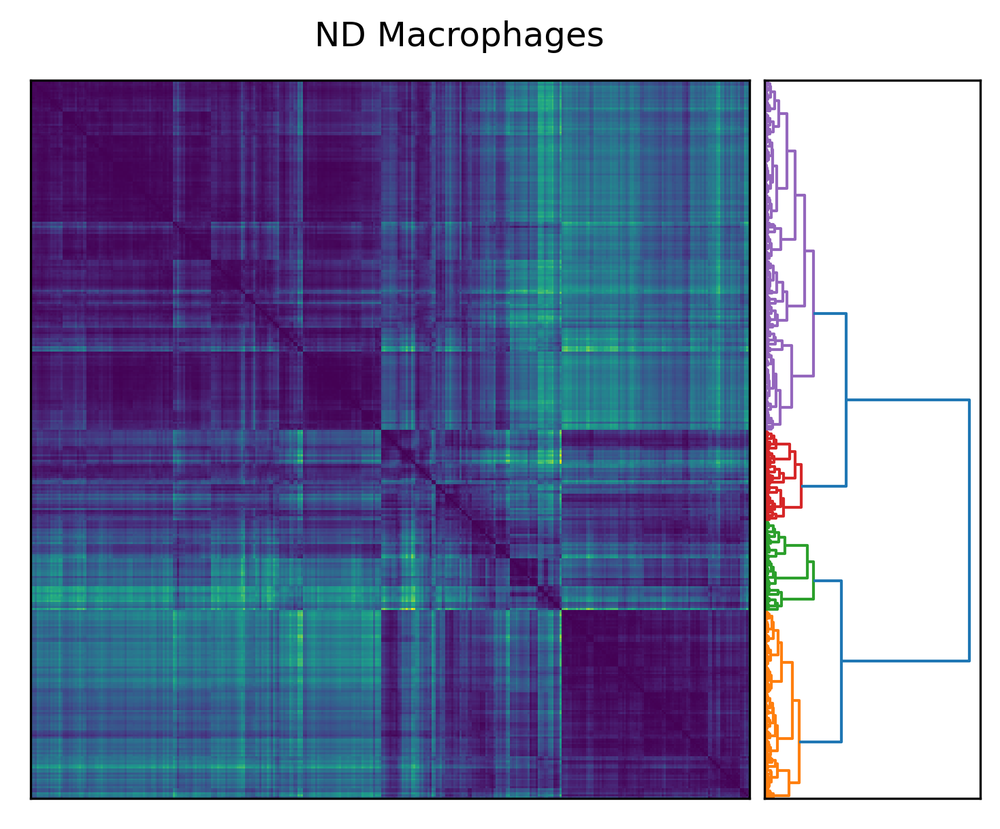

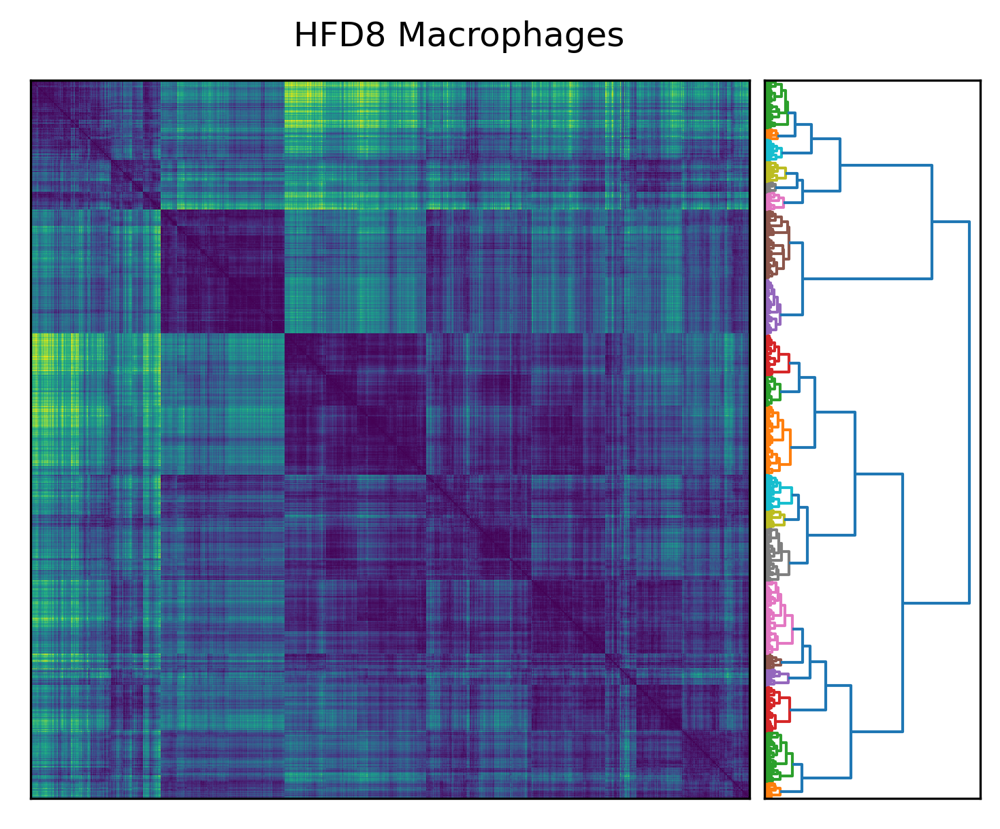

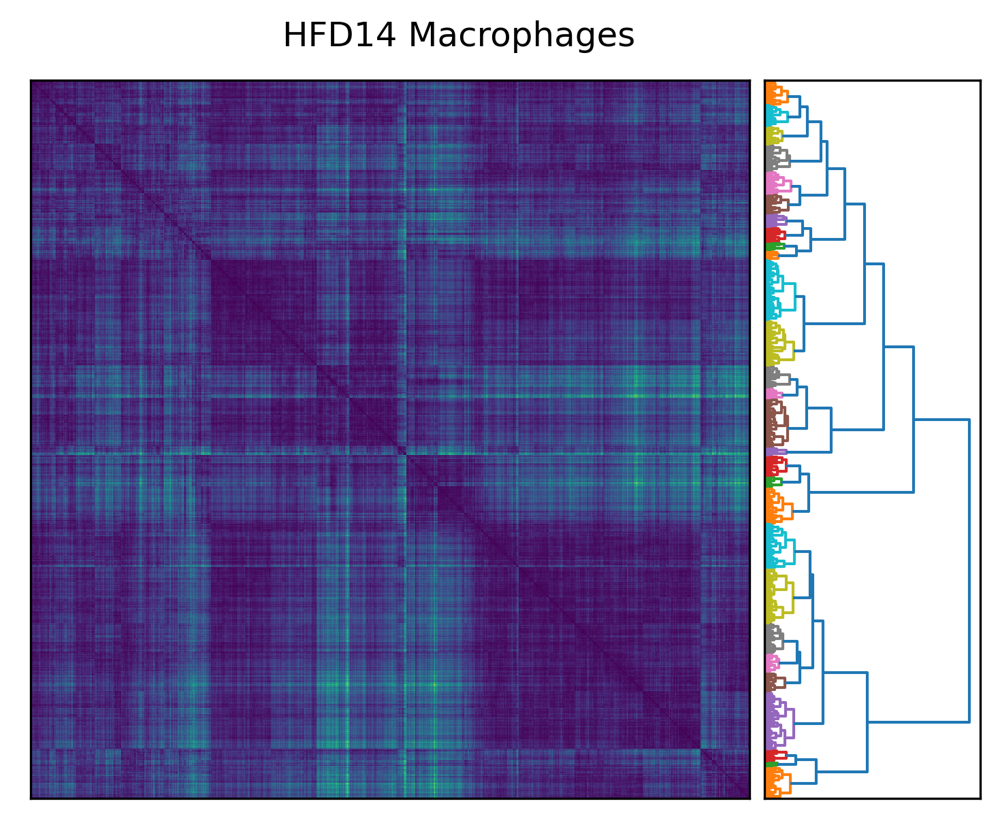

In [7]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['figure.figsize'] = 3, 6
plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.color'] = 'k'

keys = ['ND', 'HFD8', 'HFD14']
nPCA = 10
colorthreshold = 75
vmax = 10e-11

ctypes = ['Macrophages']

res = []

for key in keys:
    data = adata[key]
    
    # get the run key
    allKeys = list(data.obs.keys() )
    allKeys.remove('n_genes')
    runKey = allKeys[0]
    
    embedding = data.obsm['X_pca'][:, 0:nPCA]
    result = data.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    clusterIds = data.obs[runKey].astype(int) + 1  # note that these are zero-indexed!
    
    distances = data.obsp['distances']
    connectivities = data.obsp['connectivities']
    
    cellTypes = cid[key]
    
    # get the run key
    allKeys = list(data.obs.keys() )
    allKeys.remove('n_genes')
    runKey = allKeys[0]
    
    for ctype in ctypes:
        ctypeId = cellTypes[cellTypes['cellType'] == ctype]['clusterId'].to_list()
        mask = clusterIds.isin(ctypeId)
        
        print(key, ctype, mask.sum(), len(ctypeId))
        
        X = embedding[mask, :] # PCA space within cluster cells
        D = squareform(pdist(X, jsd)) # symetric KL divergence between within cluster cells
        
        # clustering results
        model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
        model = model.fit(X)
        linkage_matrix  = get_dendogram(model)
        
        # get corresponding dendrogram for matrix sorting
        r = dendrogram(linkage_matrix, orientation='left', no_plot=True)
        newOrder = r['leaves'][::-1]
        
        Dhat = D[newOrder, :][:, newOrder]
        
        plt.matshow(Dhat, vmin=0, vmax=vmax)
        ax = plt.gca()
        ax.set_xticks([])
        ax.set_yticks([])
        
        # plot the dendogram
        ax_divider = make_axes_locatable(ax)
        ax2 = ax_divider.append_axes("right", 
                             size="30%", 
                             pad=f"2%")
        
        # plot it
        dendrogram(linkage_matrix, 
                   orientation='right', 
                   color_threshold=colorthreshold,
                   ax=ax2)
        
        ax2.set_yticks([])
        ax2.set_xticks([])
        
        plt.suptitle(f"{key} {ctype}", y=0.82)
    

In [8]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['figure.figsize'] = 3, 6
plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.color'] = 'k'

keys = ['ND', 'HFD8', 'HFD14']
nPCA = 10
colorthreshold = 75
vmax = 10e-11

ctypes = ['Macrophages']

res = []

for key in keys:
    data = adata[key]
    
    # get the run key
    allKeys = list(data.obs.keys() )
    allKeys.remove('n_genes')
    runKey = allKeys[0]
    
    embedding = data.obsm['X_pca'][:, 0:nPCA]
    result = data.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    clusterIds = data.obs[runKey].astype(int) + 1  # note that these are zero-indexed!
    
    distances = data.obsp['distances']
    connectivities = data.obsp['connectivities']
    
    cellTypes = cid[key]
    
    # get the run key
    allKeys = list(data.obs.keys() )
    allKeys.remove('n_genes')
    runKey = allKeys[0]
    
    for ctype in ctypes:
        ctypeId = cellTypes[cellTypes['cellType'] == ctype]['clusterId'].to_list()
        mask = clusterIds.isin(ctypeId)
        allIds = np.where(mask, clusterIds, np.NaN)
        allIds = allIds[~np.isnan(allIds)] # drop nans
        
        print(key, ctype, mask.sum(), len(ctypeId), len(allIds))
        
        X = embedding[mask, :] # PCA space within cluster cells
        
        # clustering results
        model = AgglomerativeClustering(n_clusters=4)
        model = model.fit(X)
        
        newClusters = model.labels_
        newClusterIds = set(model.labels_)
    
        for newLabel in newClusterIds:
            
            ypred = np.where(newClusters == newLabel, 1, 0) 
            
            for oldLabel in ctypeId:
                ytrue = np.where(allIds == oldLabel, 1, 0)
                
                s = metrics.jaccard_score(ytrue, ypred)
                print(f"New Cluster {newLabel} vs Old Cluster {oldLabel}: {s:.4f}")
            
#             print(ypred)
            
#             for oldLabel in ctypeId:
#                 ytrue = np.where(clusterIds == oldLabel, 1, 0) 
                
#                 print(ypred.shape, ytrue.shape)
                
#             break
            
            
        
#         clustys = r['color_list']
        
        
#         print(r['color_list'][:10])
#         print(r.keys())
        
        
        break
    break

ND Macrophages 359 4 359
New Cluster 0 vs Old Cluster 1: 0.0000
New Cluster 0 vs Old Cluster 3: 0.0909
New Cluster 0 vs Old Cluster 11: 0.1781
New Cluster 0 vs Old Cluster 15: 0.3913
New Cluster 1 vs Old Cluster 1: 0.9609
New Cluster 1 vs Old Cluster 3: 0.0000
New Cluster 1 vs Old Cluster 11: 0.0093
New Cluster 1 vs Old Cluster 15: 0.0052
New Cluster 2 vs Old Cluster 1: 0.0184
New Cluster 2 vs Old Cluster 3: 0.1053
New Cluster 2 vs Old Cluster 11: 0.4098
New Cluster 2 vs Old Cluster 15: 0.0000
New Cluster 3 vs Old Cluster 1: 0.0000
New Cluster 3 vs Old Cluster 3: 0.7500
New Cluster 3 vs Old Cluster 11: 0.0075
New Cluster 3 vs Old Cluster 15: 0.0000


In [9]:
r['ivl']

['1283',
 '1936',
 '25',
 '3245',
 '951',
 '2032',
 '24',
 '3508',
 '829',
 '3335',
 '1284',
 '3871',
 '3360',
 '721',
 '1790',
 '2743',
 '644',
 '2808',
 '3522',
 '1236',
 '2017',
 '2314',
 '2353',
 '3185',
 '2679',
 '3302',
 '3498',
 '288',
 '322',
 '662',
 '997',
 '2375',
 '300',
 '3698',
 '118',
 '2661',
 '1152',
 '1281',
 '3105',
 '3803',
 '1259',
 '1366',
 '3692',
 '3007',
 '3364',
 '2421',
 '2147',
 '3264',
 '587',
 '193',
 '2162',
 '1683',
 '248',
 '1340',
 '286',
 '2865',
 '2318',
 '3650',
 '1538',
 '2492',
 '218',
 '3083',
 '10',
 '547',
 '2926',
 '1892',
 '2377',
 '589',
 '1252',
 '85',
 '2949',
 '3120',
 '1681',
 '2753',
 '2839',
 '3471',
 '1502',
 '3725',
 '1539',
 '1992',
 '2488',
 '1317',
 '608',
 '1712',
 '2729',
 '3438',
 '2715',
 '2137',
 '3012',
 '2996',
 '3667',
 '994',
 '1594',
 '2386',
 '2313',
 '2674',
 '3227',
 '3826',
 '349',
 '3174',
 '2319',
 '2747',
 '3406',
 '851',
 '935',
 '2945',
 '2963',
 '3389',
 '1003',
 '2849',
 '559',
 '1930',
 '3000',
 '3026',
 '207